In [3]:
# import kagglehub
import kagglehub
kagglehub.login()


Kaggle credentials set.
Kaggle credentials successfully validated.


In [4]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

danielvaldez202021_proyect_ds_dataset_path = kagglehub.dataset_download("danielvaldez202021/proyect-ds-dataset")


print("Path to dataset files:", danielvaldez202021_proyect_ds_dataset_path)

Path to dataset files: /root/.cache/kagglehub/datasets/danielvaldez202021/proyect-ds-dataset/versions/8


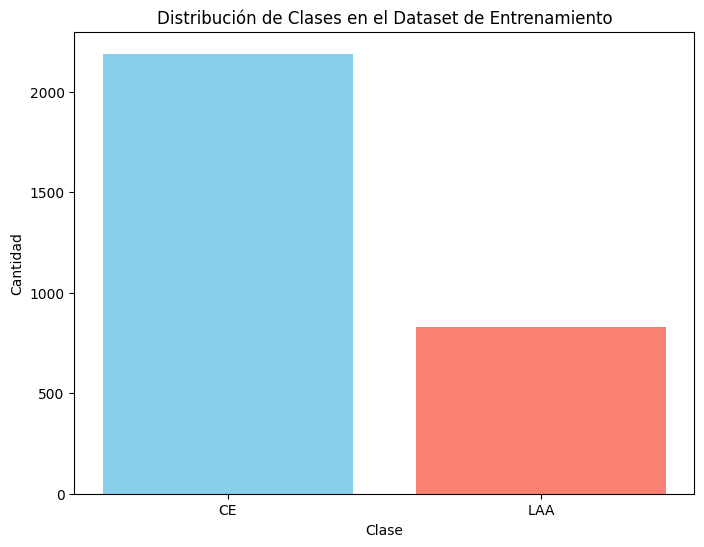

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import os

# Ruta al directorio donde están almacenados los archivos de etiquetas
data_path = danielvaldez202021_proyect_ds_dataset_path

# Función para obtener todos los archivos de etiquetas en los folds
def get_label_files(data_path, fold_num, dataset_type="train"):
    label_files = []
    for file in os.listdir(data_path):
        if f"{dataset_type}_fold{fold_num}" in file and file.startswith("y"):
            label_files.append(os.path.join(data_path, file))
    return label_files

# Recopilar todas las etiquetas
all_labels = []

# Recorrer todos los folds y cargar sólo los archivos de etiquetas
for fold_num in range(5):  # Asumiendo 5 folds
    label_files = get_label_files(data_path, fold_num, dataset_type="train")
    for lbl_file in label_files:
        labels = np.load(lbl_file)
        all_labels.extend(labels)  # Agregar todas las etiquetas de este archivo

# Mapear etiquetas de texto a enteros, si es necesario
label_mapping = {'CE': 0, 'LAA': 1}
mapped_labels = [label_mapping[label] for label in all_labels]

# Contar la cantidad de cada clase
label_counts = Counter(mapped_labels)

# Crear la gráfica de proporción de clases
class_names = ["CE", "LAA"]
class_counts = [label_counts[0], label_counts[1]]  # CE = 0, LAA = 1

plt.figure(figsize=(8, 6))
plt.bar(class_names, class_counts, color=["skyblue", "salmon"])
plt.xlabel("Clase")
plt.ylabel("Cantidad")
plt.title("Distribución de Clases en el Dataset de Entrenamiento")
plt.show()


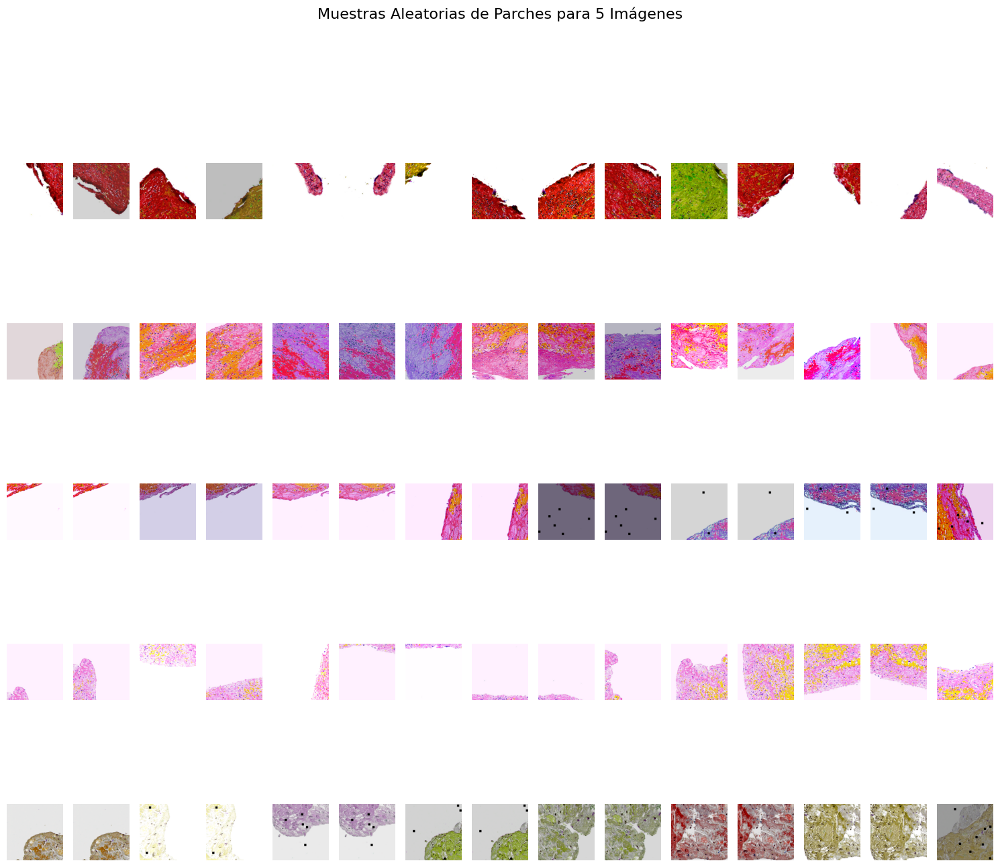

In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Carga un fragmento de ejemplo (asumiendo que cada uno contiene múltiples imágenes con sus parches)
# Actualiza la ruta para apuntar a uno de tus archivos `X_train` o `X_val`
chunk_path = os.path.join(data_path, "X_val_fold1_chunk_0.npy")
data = np.load(chunk_path)

# Selecciona aleatoriamente 5 imágenes para inspeccionar
num_images = 5
fig, axes = plt.subplots(num_images, 15, figsize=(15, num_images * 3))

for img_index in range(num_images):
    # Escoger aleatoriamente la imagen
    patches = data[np.random.randint(0, data.shape[0])]
    for patch_index in range(15):  # Muestra 5 parches por imagen
        axes[img_index, patch_index].imshow(patches[patch_index].transpose(1, 2, 0))  # Transpone si está en formato canales-primero
        axes[img_index, patch_index].axis('off')

plt.suptitle("Muestras Aleatorias de Parches para 5 Imágenes", fontsize=16)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()


In [18]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
import torch.optim as optim
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm

# Definir el dispositivo
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Usando el dispositivo: {device}')

# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Aplanar las listas de imágenes y etiquetas
        self.images = []
        self.targets = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            self.images.extend(X_chunk)
            self.targets.extend(y_chunk)

        # Codificar las etiquetas
        self.le = LabelEncoder()
        self.targets = self.le.fit_transform(self.targets)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        image = self.images[idx]
        # Normalizar las imágenes
        image = image.astype(np.float32) / 255.0
        # Convertir a tensor
        image = torch.tensor(image)
        label = self.targets[idx]
        return image, label

# Función para crear el DataLoader con WeightedRandomSampler
def create_data_loader(dataset, batch_size):
    # Calcular las muestras por clase
    class_sample_count = np.array([len(np.where(dataset.targets == t)[0]) for t in np.unique(dataset.targets)])
    weight = 1. / class_sample_count
    samples_weight = np.array([weight[t] for t in dataset.targets])

    samples_weight = torch.from_numpy(samples_weight)
    sampler = WeightedRandomSampler(samples_weight.type('torch.DoubleTensor'), len(samples_weight))

    data_loader = DataLoader(dataset, batch_size=batch_size, sampler=sampler, num_workers=4)
    return data_loader

# Definir el modelo
class EfficientNetClassifier(nn.Module):
    def __init__(self, num_classes):
        super(EfficientNetClassifier, self).__init__()
        # Cargar modelo pre-entrenado con los pesos recomendados
        self.model = efficientnet_b0(weights=EfficientNet_B0_Weights.DEFAULT)
        # Reemplazar la capa final
        self.model.classifier[1] = nn.Linear(self.model.classifier[1].in_features, num_classes)

    def forward(self, x):
        return self.model(x)

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Parámetros
batch_size = 32
num_epochs = 10
learning_rate = 1e-4

# Crear datasets y dataloaders
train_dataset = CustomImageDataset(data_dir, 'train_fold0')  # Puedes cambiar el fold si es necesario
val_dataset = CustomImageDataset(data_dir, 'val_fold0')

train_loader = create_data_loader(train_dataset, batch_size)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

# Inicializar el modelo, pérdida y optimizador
num_classes = len(np.unique(train_dataset.targets))
model = EfficientNetClassifier(num_classes)
model = model.to(device)

# Utilizar CrossEntropyLoss con pesos de clase
class_counts = np.bincount(train_dataset.targets)
class_weights = 1. / class_counts
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)

optimizer = optim.Adam(model.parameters(), lr=learning_rate)

# Función de entrenamiento
def train(model, loader, criterion, optimizer):
    model.train()
    running_loss = 0.0
    for images, labels in tqdm(loader, desc='Entrenando'):
        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss

# Función de validación
def evaluate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    preds = []
    true_labels = []
    with torch.no_grad():
        for images, labels in tqdm(loader, desc='Validando'):
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)
            preds.extend(predicted.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    epoch_loss = running_loss / len(loader.dataset)
    return epoch_loss, preds, true_labels

# Ciclo de entrenamiento
best_val_loss = float('inf')
for epoch in range(num_epochs):
    print(f'Epoch {epoch+1}/{num_epochs}')
    train_loss = train(model, train_loader, criterion, optimizer)
    val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)

    print(f'Pérdida de entrenamiento: {train_loss:.4f}')
    print(f'Pérdida de validación: {val_loss:.4f}')

    # Mostrar métricas
    print('Reporte de clasificación:')
    print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
    print('Matriz de confusión:')
    print(confusion_matrix(val_true, val_preds))

    # Guardar el modelo si mejora
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save(model.state_dict(), 'best_model.pth')
        print('Modelo mejorado y guardado.')

print('Entrenamiento completado.')

# Cargar el mejor modelo para inferencia
model.load_state_dict(torch.load('best_model.pth'))

# Puedes continuar con la evaluación en el conjunto de prueba si lo deseas


Usando el dispositivo: cuda
Epoch 1/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.92it/s]


Pérdida de entrenamiento: 0.3130
Pérdida de validación: 0.3830
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.92      0.81      0.86      1650
         LAA       0.61      0.80      0.70       615

    accuracy                           0.81      2265
   macro avg       0.76      0.81      0.78      2265
weighted avg       0.83      0.81      0.82      2265

Matriz de confusión:
[[1336  314]
 [ 120  495]]
Modelo mejorado y guardado.
Epoch 2/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.69it/s]


Pérdida de entrenamiento: 0.1583
Pérdida de validación: 0.3727
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.91      0.90      0.90      1650
         LAA       0.73      0.76      0.74       615

    accuracy                           0.86      2265
   macro avg       0.82      0.83      0.82      2265
weighted avg       0.86      0.86      0.86      2265

Matriz de confusión:
[[1477  173]
 [ 148  467]]
Modelo mejorado y guardado.
Epoch 3/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


Pérdida de entrenamiento: 0.0886
Pérdida de validación: 0.4067
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.91      0.95      0.93      1650
         LAA       0.84      0.73      0.78       615

    accuracy                           0.89      2265
   macro avg       0.87      0.84      0.86      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1564   86]
 [ 163  452]]
Epoch 4/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.96it/s]


Pérdida de entrenamiento: 0.0583
Pérdida de validación: 0.4806
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.95      0.93      1650
         LAA       0.85      0.72      0.78       615

    accuracy                           0.89      2265
   macro avg       0.87      0.84      0.85      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1571   79]
 [ 172  443]]
Epoch 5/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.71it/s]


Pérdida de entrenamiento: 0.0474
Pérdida de validación: 0.4870
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.95      0.92      1650
         LAA       0.84      0.72      0.78       615

    accuracy                           0.89      2265
   macro avg       0.87      0.83      0.85      2265
weighted avg       0.88      0.89      0.88      2265

Matriz de confusión:
[[1567   83]
 [ 173  442]]
Epoch 6/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.83it/s]


Pérdida de entrenamiento: 0.0333
Pérdida de validación: 0.5739
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.97      0.93      1650
         LAA       0.89      0.68      0.77       615

    accuracy                           0.89      2265
   macro avg       0.89      0.82      0.85      2265
weighted avg       0.89      0.89      0.88      2265

Matriz de confusión:
[[1598   52]
 [ 198  417]]
Epoch 7/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.55it/s]


Pérdida de entrenamiento: 0.0264
Pérdida de validación: 0.6829
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.97      0.93      1650
         LAA       0.89      0.68      0.77       615

    accuracy                           0.89      2265
   macro avg       0.89      0.82      0.85      2265
weighted avg       0.89      0.89      0.89      2265

Matriz de confusión:
[[1598   52]
 [ 196  419]]
Epoch 8/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.69it/s]


Pérdida de entrenamiento: 0.0233
Pérdida de validación: 0.6201
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.90      0.95      0.92      1650
         LAA       0.83      0.71      0.76       615

    accuracy                           0.88      2265
   macro avg       0.86      0.83      0.84      2265
weighted avg       0.88      0.88      0.88      2265

Matriz de confusión:
[[1563   87]
 [ 181  434]]
Epoch 9/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 17.01it/s]


Pérdida de entrenamiento: 0.0256
Pérdida de validación: 0.6239
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.95      0.92      1650
         LAA       0.85      0.70      0.77       615

    accuracy                           0.88      2265
   macro avg       0.87      0.83      0.85      2265
weighted avg       0.88      0.88      0.88      2265

Matriz de confusión:
[[1575   75]
 [ 186  429]]
Epoch 10/10


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.94it/s]
<ipython-input-18-4f4c47ab15e4>:185: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.loa

Pérdida de entrenamiento: 0.0221
Pérdida de validación: 0.6571
Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.89      0.98      0.93      1650
         LAA       0.91      0.68      0.78       615

    accuracy                           0.90      2265
   macro avg       0.90      0.83      0.86      2265
weighted avg       0.90      0.90      0.89      2265

Matriz de confusión:
[[1610   40]
 [ 194  421]]
Entrenamiento completado.


<All keys matched successfully>

In [19]:
from sklearn.metrics import classification_report, confusion_matrix
# Dentro del ciclo de entrenamiento
val_loss, val_preds, val_true = evaluate(model, val_loader, criterion)


# Mostrar métricas
print('Reporte de clasificación:')
print(classification_report(val_true, val_preds, target_names=train_dataset.le.classes_))
print('Matriz de confusión:')
print(confusion_matrix(val_true, val_preds))


Validando: 100%|██████████| 71/71 [00:04<00:00, 16.57it/s]

Reporte de clasificación:
              precision    recall  f1-score   support

          CE       0.91      0.90      0.90      1650
         LAA       0.73      0.76      0.74       615

    accuracy                           0.86      2265
   macro avg       0.82      0.83      0.82      2265
weighted avg       0.86      0.86      0.86      2265

Matriz de confusión:
[[1477  173]
 [ 148  467]]


In [46]:
# Definir la clase Dataset personalizada
class CustomImageDataset(Dataset):
    def __init__(self, data_dir, dataset_type):
        self.data_dir = data_dir
        self.dataset_type = dataset_type
        self.image_files = []
        self.labels = []

        # Cargar todos los archivos .npy
        for file_name in os.listdir(data_dir):
            if file_name.startswith(f'X_{dataset_type}_chunk_') and file_name.endswith('.npy'):
                chunk_index = file_name.split('_')[-1].split('.')[0]
                X_path = os.path.join(data_dir, file_name)
                y_path = os.path.join(data_dir, f'y_{dataset_type}_chunk_{chunk_index}.npy')
                if os.path.exists(y_path):
                    self.image_files.append(X_path)
                    self.labels.append(y_path)

        # Aplanar las listas de imágenes y etiquetas
        self.images = []
        self.targets = []
        for X_file, y_file in zip(self.image_files, self.labels):
            X_chunk = np.load(X_file)  # Forma: (num_imágenes, num_patches, C, H, W)
            y_chunk = np.load(y_file)  # Forma: (num_imágenes,)

            num_images, num_patches, C, H, W = X_chunk.shape
            # Aplanar los parches
            X_chunk = X_chunk.reshape(-1, C, H, W)  # Nueva forma: (num_imágenes * num_patches, C, H, W)
            # Repetir las etiquetas para cada parche
            y_chunk = np.repeat(y_chunk, num_patches)

            self.images.extend(X_chunk)
            self.targets.extend(y_chunk)

        # Codificar las etiquetas
        self.le = LabelEncoder()
        self.targets = self.le.fit_transform(self.targets)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        image = self.images[idx]
        # Normalizar las imágenes
        image = image.astype(np.float32) / 255.0
        # Convertir a tensor
        image = torch.tensor(image)
        label = self.targets[idx]
        return image, label

# Ruta a los datos
data_dir = danielvaldez202021_proyect_ds_dataset_path  # Reemplaza con la ruta real a tus datos

# Crear el dataset completo
full_dataset = CustomImageDataset(data_dir, 'val_fold0')

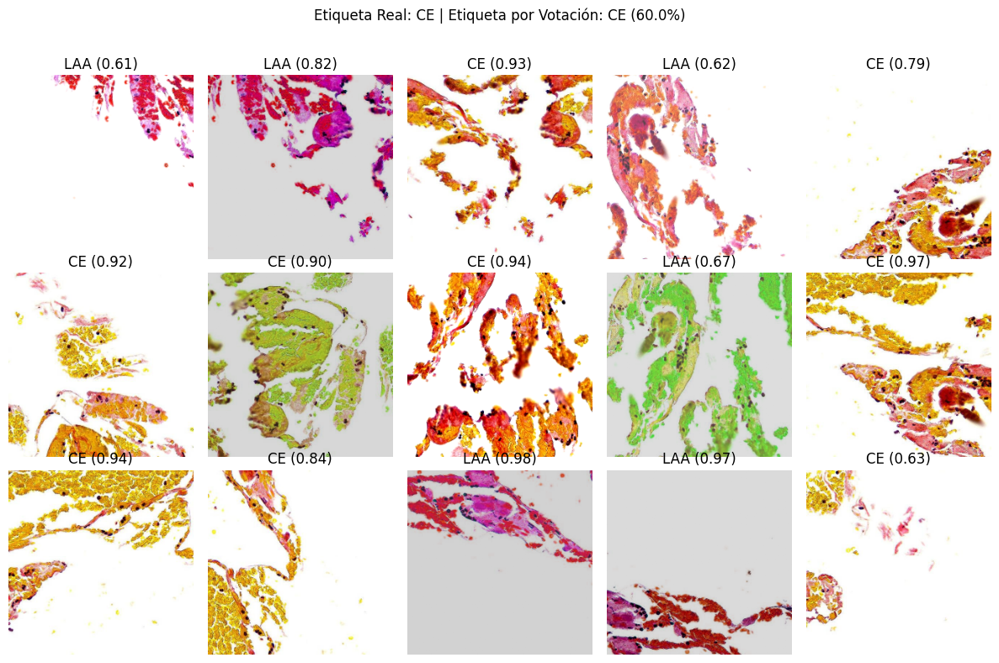

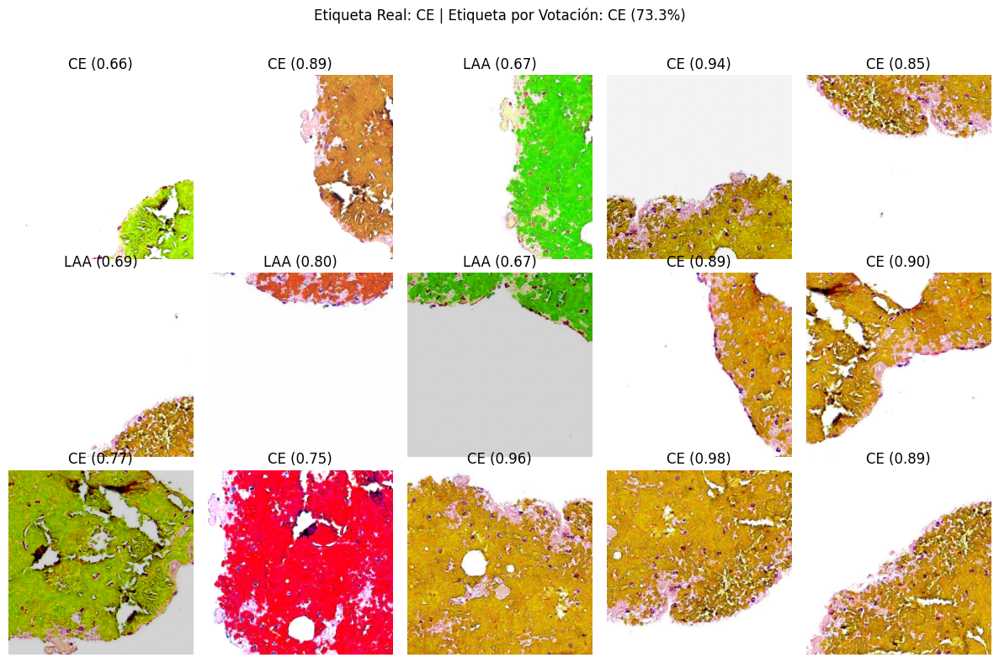

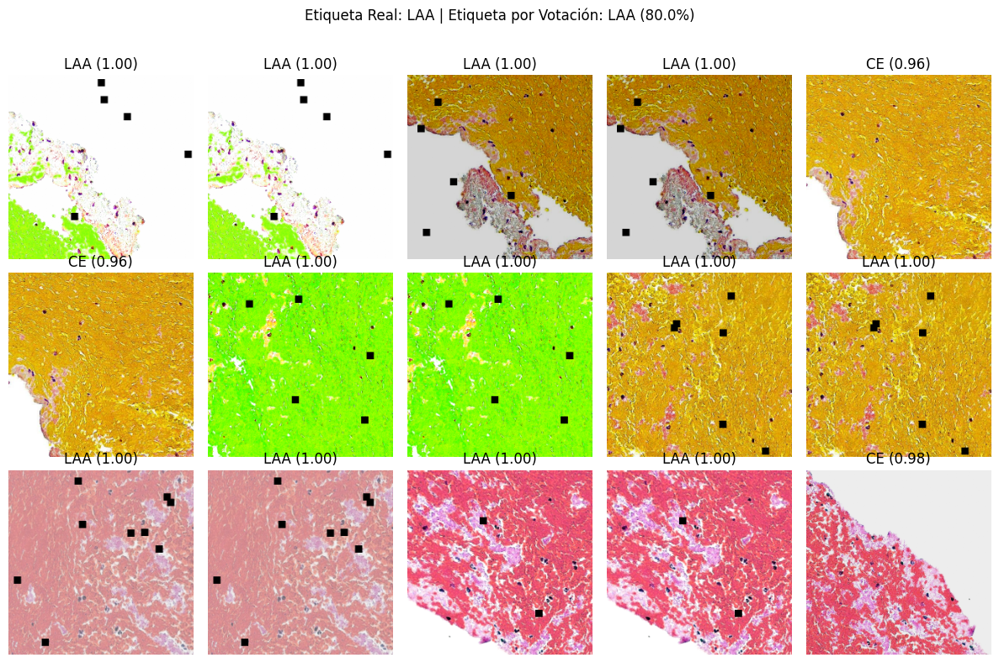

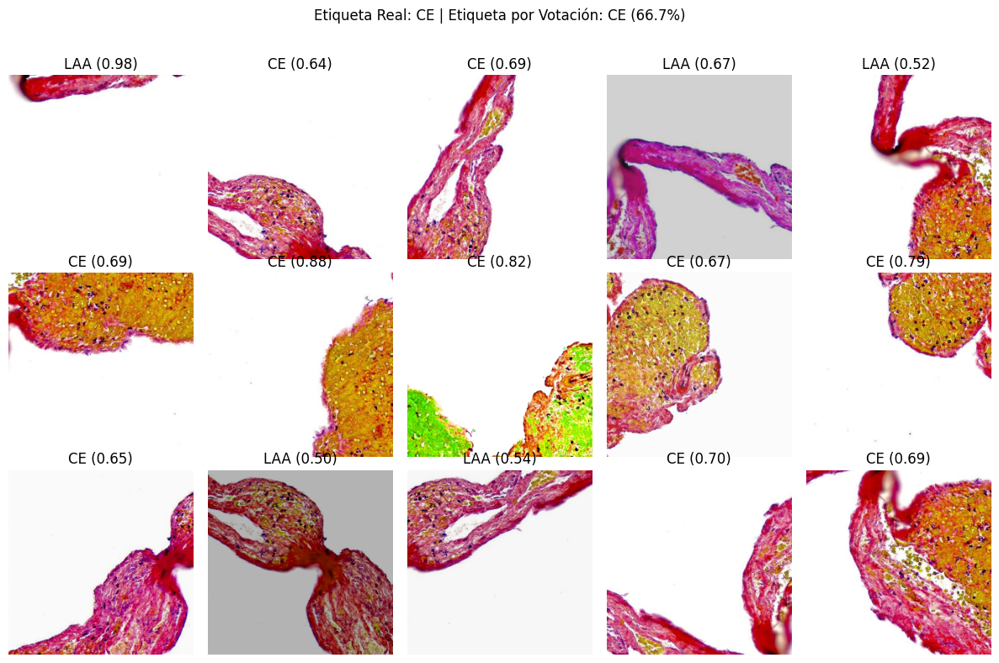

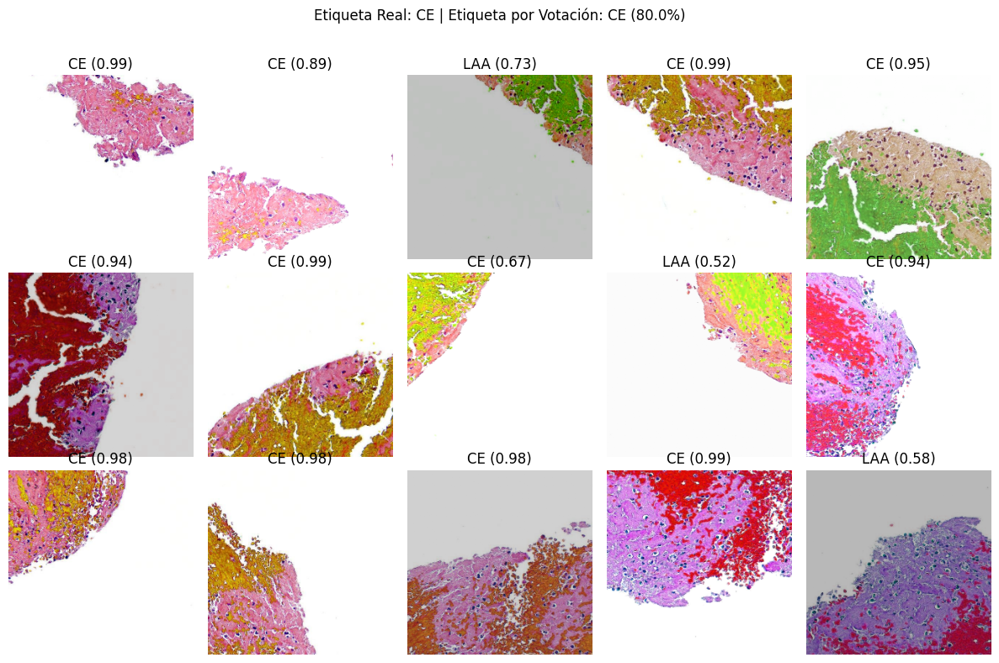

In [48]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from collections import Counter

# Seleccionar una muestra aleatoria de imágenes (conjunto de 5 imágenes completas, cada una con sus 15 parches)
sample_images = random.sample(list(np.unique([i // 15 for i in range(len(full_dataset))])), 5)

for img_idx in sample_images:
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # Ajustado a 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]

    # Configurar la cuadrícula de visualización de parches
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))  # 3 filas x 5 columnas para 15 parches
    fig.suptitle(f"Etiqueta Real: {true_label}")

    for ax, idx in zip(axes.flatten(), patch_indices):
        image, _ = full_dataset[idx]
        image_np = image.numpy().transpose(1, 2, 0)

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)

        # Construir el título de cada parche con la predicción y su probabilidad
        top1_confidence = prob[pred_label_index]
        title_text = f"{pred_label} ({top1_confidence:.2f})"

        # Mostrar el parche y su predicción principal
        ax.imshow(image_np)
        ax.set_title(title_text)
        ax.axis('off')

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    vote_percentage = vote_counts.most_common(1)[0][1] / len(votes) * 100

    # Agregar la predicción final por votación en el título principal
    fig.suptitle(f"Etiqueta Real: {true_label} | Etiqueta por Votación: {voted_label} ({vote_percentage:.1f}%)")

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajustar espacio superior para el título principal
    plt.show()


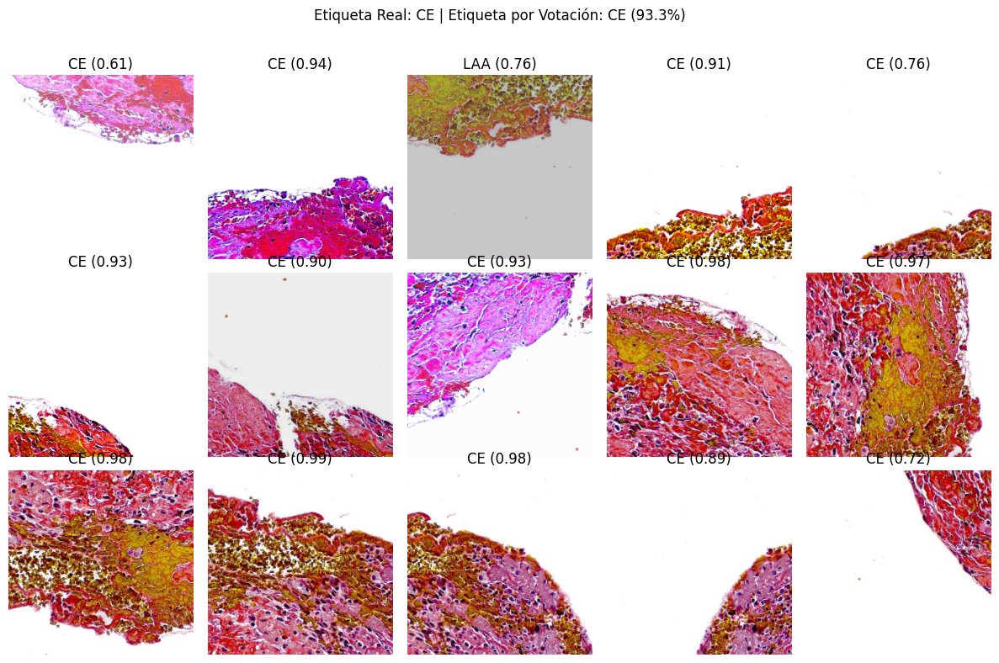

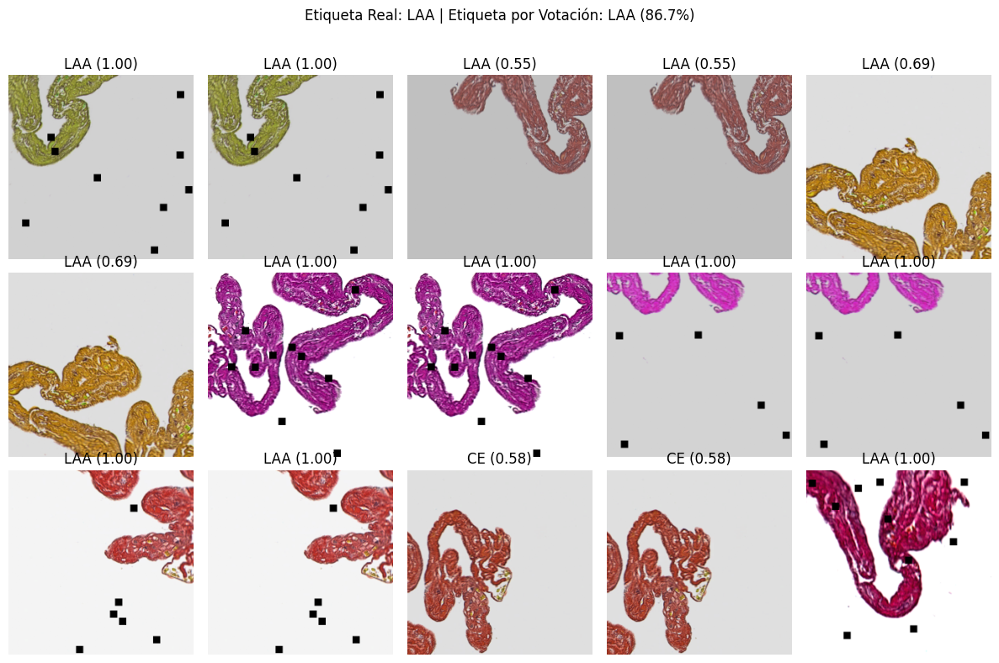

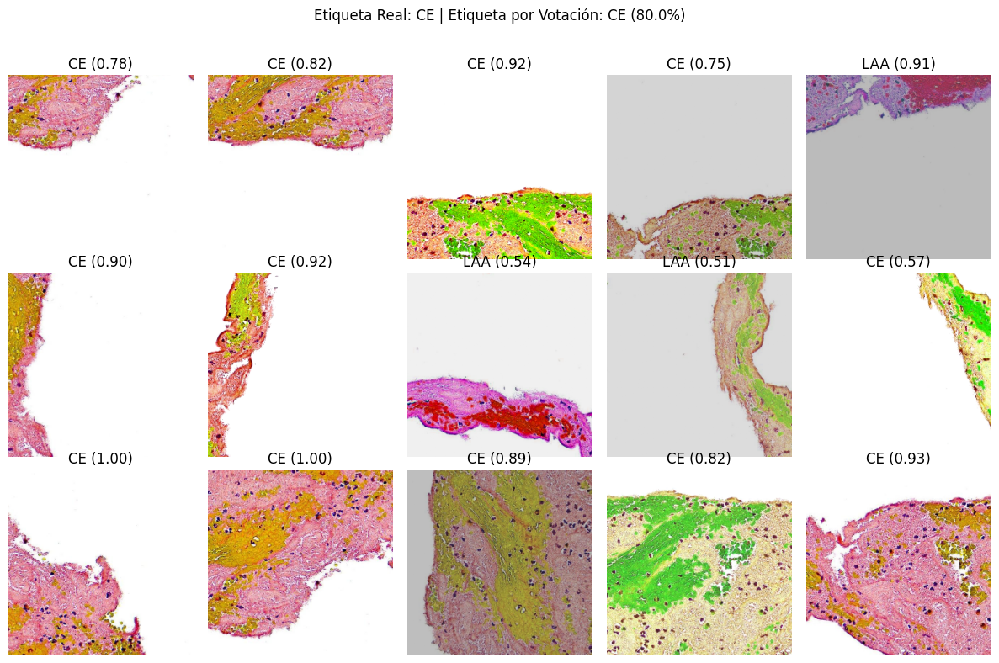

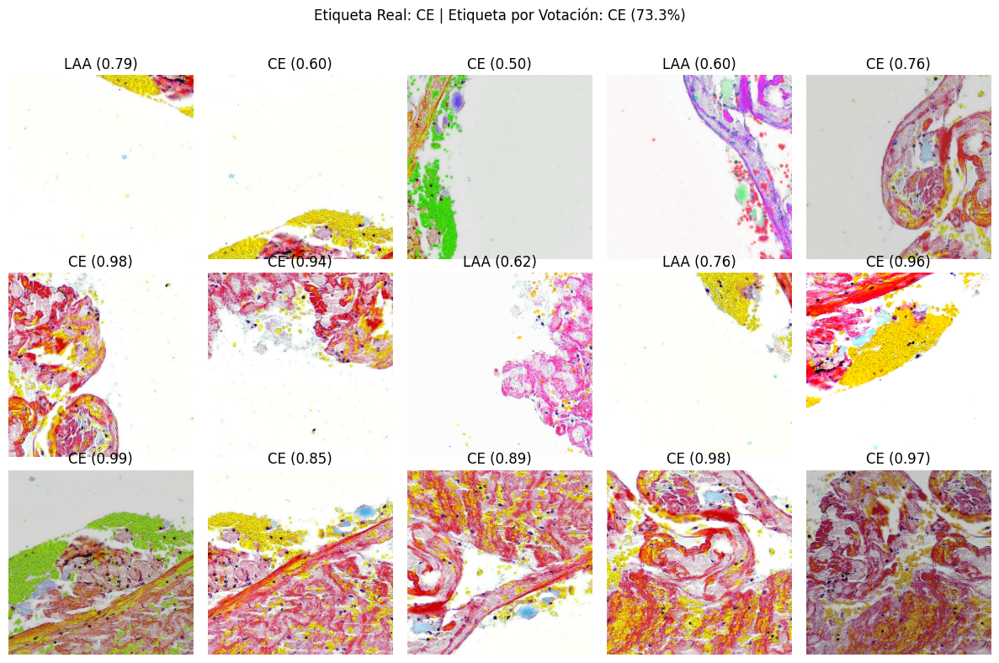

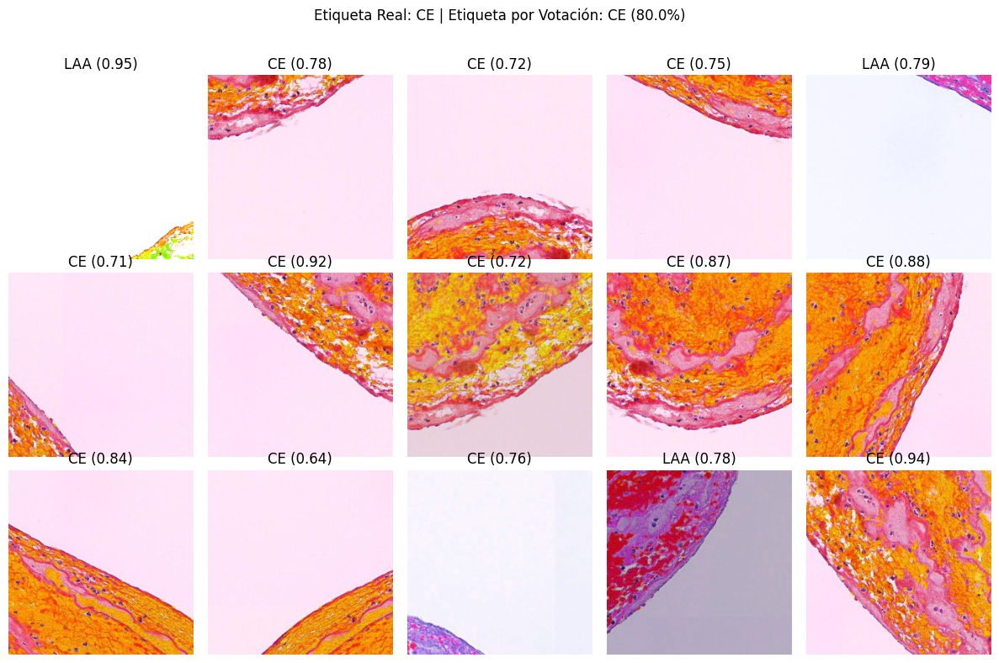

In [49]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from collections import Counter

# Seleccionar una muestra aleatoria de imágenes (conjunto de 5 imágenes completas, cada una con sus 15 parches)
sample_images = random.sample(list(np.unique([i // 15 for i in range(len(full_dataset))])), 5)

for img_idx in sample_images:
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # Ajustado a 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]

    # Configurar la cuadrícula de visualización de parches
    fig, axes = plt.subplots(3, 5, figsize=(12, 8))  # 3 filas x 5 columnas para 15 parches
    fig.suptitle(f"Etiqueta Real: {true_label}")

    for ax, idx in zip(axes.flatten(), patch_indices):
        image, _ = full_dataset[idx]
        image_np = image.numpy().transpose(1, 2, 0)

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)

        # Construir el título de cada parche con la predicción y su probabilidad
        top1_confidence = prob[pred_label_index]
        title_text = f"{pred_label} ({top1_confidence:.2f})"

        # Mostrar el parche y su predicción principal
        ax.imshow(image_np)
        ax.set_title(title_text)
        ax.axis('off')

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    vote_percentage = vote_counts.most_common(1)[0][1] / len(votes) * 100

    # Agregar la predicción final por votación en el título principal
    fig.suptitle(f"Etiqueta Real: {true_label} | Etiqueta por Votación: {voted_label} ({vote_percentage:.1f}%)")

    plt.tight_layout()
    plt.subplots_adjust(top=0.88)  # Ajustar espacio superior para el título principal
    plt.show()


<Figure size 1000x800 with 0 Axes>

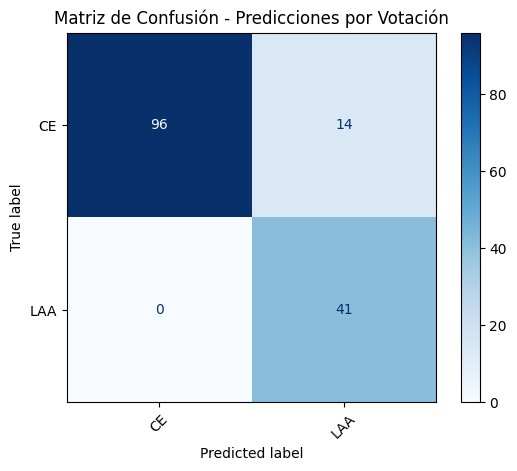

In [50]:
import random
import matplotlib.pyplot as plt
import torch
import numpy as np
from collections import Counter
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Variables para almacenar las etiquetas reales y las predicciones por votación
true_labels = []
voted_labels = []

# Realizar predicción por votación para todas las imágenes completas
num_images = len(full_dataset) // 15  # Número de imágenes completas, con 15 parches cada una

for img_idx in range(num_images):
    patch_indices = range(img_idx * 15, (img_idx + 1) * 15)  # 15 parches por imagen
    votes = []
    true_label = full_dataset.le.inverse_transform([full_dataset[patch_indices[0]][1]])[0]
    true_labels.append(true_label)  # Guardar la etiqueta real de la imagen

    # Obtener la predicción de cada parche y almacenar votos
    for idx in patch_indices:
        image, _ = full_dataset[idx]

        # Realizar predicción para el parche
        image_tensor = image.unsqueeze(0).to(device)
        with torch.no_grad():
            output = model(image_tensor)
            prob = torch.nn.functional.softmax(output, dim=1).cpu().numpy()[0]

        # Obtener la clase con mayor probabilidad y agregar a votos
        pred_label_index = prob.argmax()
        pred_label = full_dataset.le.inverse_transform([pred_label_index])[0]
        votes.append(pred_label)

    # Realizar la votación entre los parches
    vote_counts = Counter(votes)
    voted_label = vote_counts.most_common(1)[0][0]
    voted_labels.append(voted_label)  # Guardar la predicción final para la imagen

# Calcular la matriz de confusión
conf_matrix = confusion_matrix(true_labels, voted_labels, labels=full_dataset.le.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=full_dataset.le.classes_)

# Mostrar la matriz de confusión
plt.figure(figsize=(10, 8))
disp.plot(cmap="Blues", xticks_rotation=45)
plt.title("Matriz de Confusión - Predicciones por Votación")
plt.show()
